## Scripts to create and plot volume timeseries for the provide regions

In [1]:
# updated script version for flattening gfdl-esm2m overshoot stabilisation scenarios from university of Bern 
from oggm import utils
import json
import oggm
import sys
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns
# get the correct colors for the different scenarios
from analysis_func import color_scenario, label_scenario, provide_reg_full_name_dict, color_scenario_poster

palette = sns.color_palette(color_scenario.values())
scenarios = color_scenario.keys()

### First merge the filled files together

In [2]:
filled = False
if filled: 
    
    # once over basin ids
    b_per_Preg = json.load(open('/home/www/lschuster/provide/provide_glacier_regions/basin_ids_per_provide_region.json'))
    load = False
    if load:
        dfs = []
        for bc in ['_bc_2000_2019', '_bc_1980_2019']:
            clim_bc = f'w5e5_gcm_merged_from_2000{bc}'
            fpath = f'/home/www/lschuster/provide/gfdl-esm2m_oversh_stab_uni_bern/runs/output/provide_reg/{clim_bc}'
            df = []
            for preg in np.arange(1,14,1):
                if preg < 10:
                    Preg = f'P0{preg}'
                else:
                    Preg = f'P{preg}'
                for basin in b_per_Preg[Preg]:
                    path = f'{fpath}/{Preg}/filled_sum_basin_{basin}_run_hydro_w5e5_gcm_merged_from_2000_endyr2500{bc}.nc'
                    with xr.open_dataset(path) as ds:
                        #ds['ratio_area_missing_filled_vs_total'] = ds.attrs['ratio_area_missing_filled_vs_total']
                        #ds['n_glaciers_missing_filled'] = ds.attrs['n_glaciers_missing_filled']
                        ds['basin'] = basin
                        ds['provide_region'] = Preg
                        df.append(ds)
            df = xr.concat(df,dim = 'basin')
            dfs.append(df)
        df = xr.concat(dfs, dim='bias_correction')
        attrs = {'description': 'OGGM model output',
                 'oggm_version': '1.6.1.dev26+gf8a1745',
                 'calendar': '365-day no leap',
                 'creation_date': '19/06/2023',
             'information': 'OGGM v1.6.1 (v2023.3, W5E5_spinup)\n(missing glaciers were filled with average glacier statistics from similar-area glaciers of that provide region)'}
        df.attrs = attrs
        df.to_netcdf('filled_sum_all_basins_oversh_stab_2000_2500.nc')
    else:
        df_b = xr.open_dataset('filled_sum_all_basins_oversh_stab_2000_2500.nc')
        
    # once over provide regions 
    load = False
    if load:
        dfs = []
        for bc in ['_bc_2000_2019', '_bc_1980_2019']:
            clim_bc = f'w5e5_gcm_merged_from_2000{bc}'
            fpath = f'/home/www/lschuster/provide/gfdl-esm2m_oversh_stab_uni_bern/runs/output/provide_reg/{clim_bc}'
            df = []
            for preg in np.arange(1,14,1):
                if preg < 10:
                    Preg = f'P0{preg}'
                else:
                    Preg = f'P{preg}'
                path = f'{fpath}/{Preg}/filled_sum_provide_reg_{Preg}_run_hydro_w5e5_gcm_merged_from_2000_endyr2500{bc}.nc'
                with xr.open_dataset(path) as ds:
                    ds['ratio_area_missing_filled_vs_total'] = ds.attrs['ratio_area_missing_filled_vs_total']
                    ds['n_glaciers_missing_filled'] = ds.attrs['n_glaciers_missing_filled']
                    df.append(ds)
            df = xr.concat(df,dim = 'provide_region')
            dfs.append(df)
        df = xr.concat(dfs, dim='bias_correction')
        df.attrs.pop('provide_region')
        df.attrs.pop('ratio_area_missing_filled_vs_total')
        df.attrs.pop('n_glaciers_missing_filled')
        df.attrs.pop('scenario')
        df.to_netcdf('filled_sum_all_provide_reg_oversh_stab_2000_2500.nc')
    else:
        df = xr.open_dataset('filled_sum_all_provide_reg_oversh_stab_2000_2500.nc')


For comparison also just look at the common running glaciers:

In [3]:
compare_between_bc = False
if compare_between_bc:
    all_running_rgis_d = {}
    bcs =  ['_bc_1980_2019', '_bc_2000_2019']
    for bc in ['_bc_1980_2019', '_bc_2000_2019']:
        pd_working = pd.read_csv(f'../working_rgis_for_oversh_stab_scenarios{bc}.csv', index_col='rgiid')
        all_running_rgis_d[bc] = pd_working[scenarios].dropna().index.values
        print(len(all_running_rgis_d[bc]))
    all_running_rgis = list(set(all_running_rgis_d['_bc_1980_2019']).intersection(all_running_rgis_d['_bc_2000_2019']))
    pd_working_all = pd_working.loc[all_running_rgis][['area','all_running_rgis', 'rgi_reg']] 
    
else:
    bc = '_bc_1980_2019' # more glaciers/glacier area works for this bc option
    bcs = [bc]
    pd_working_all = pd.read_csv(f'../working_rgis_for_oversh_stab_scenarios{bc}.csv', index_col='rgiid')[['area','all_running_rgis', 'rgi_reg']]
    all_running_rgis = pd_working_all.dropna().index.values
    
import json
frgi = utils.file_downloader('https://cluster.klima.uni-bremen.de/~oggm/rgi/rgi62_stats.h5')
#frgi = '/home/users/lschuster/glacierMIP/rgi62_stats.h5'
odf = pd.read_hdf(frgi, index_col=0)
for pi in np.arange(1,14,1):
    f = open('/home/www/lschuster/provide/provide_glacier_regions/rgi_ids_per_provide_region.json')
    if pi<10:
        Preg = f'P0{pi}'
    else:
        Preg = f'P{pi}'
    rgis_basin = json.load(f)[Preg]
    # remove connectivity level 2 glaciers only important for P03 (Greenland)
    rgis_basin = odf.loc[rgis_basin].loc[odf.loc[rgis_basin].Connect <2].index.values
    rgis_basin_w = list(set(rgis_basin).intersection(pd_working_all.index))
    pd_working_all.loc[rgis_basin_w,'provide_reg'] = Preg

pd_geodetic = utils.get_geodetic_mb_dataframe()[utils.get_geodetic_mb_dataframe().period=='2000-01-01_2020-01-01']

In [4]:
load=False
# do the same for the provide regions with runoff 
if load:
    df_scenario_bc_l= []
    for bc in bcs:
        pd_geodetic_running = pd_geodetic.loc[all_running_rgis]
        df = []
        for preg in np.arange(1,14,1):
            if preg < 10:
                Preg = f'P0{preg}'
            else:
                Preg = f'P{preg}'
            print(Preg)
            dpath = f'/home/www/lschuster/provide/gfdl-esm2m_oversh_stab_uni_bern/runs/output/provide_reg/w5e5_gcm_merged_from_2000{bc}'
            # amount of glaciers in that rgi region
            #rgi_reg_glaciers = pd_geodetic.loc[pd_geodetic.reg==int(rgi_reg)].index
            rgi_reg_glaciers_working = pd_working_all.loc[pd_working_all.provide_reg == Preg]['all_running_rgis'].dropna().index.values

            with xr.open_mfdataset(f'{dpath}/{Preg}/provide_reg_{Preg}_*_run_hydro_w5e5_gcm_merged_from_2000_endyr2500{bc}.nc') as ds:
                ds_a = ds[['runoff', 'volume', 'area', 'melt_off_on']].sel(rgi_id=rgi_reg_glaciers_working)
                ds_a = ds.sum(dim='rgi_id').load()
                # maybe this is a bit faster 
                ds_m = ds[['runoff_monthly', 'melt_off_on_monthly']].sel(rgi_id=rgi_reg_glaciers_working).sum(dim='rgi_id')
                ds_a[['runoff_monthly', 'melt_off_on_monthly']] = ds_m.load()
                df.append(ds_a)
        df_scenario_bc= xr.concat(df, dim='provide_region', fill_value=np.NaN)
        df_scenario_bc.coords['bias_correction'] = bc[1:]
        df_scenario_bc_l.append(df_scenario_bc)
    df_scenario_common = xr.concat(df_scenario_bc_l, dim='bias_correction', fill_value=np.NaN)
    if compare_between_bc:
        df_scenario_common.to_netcdf(f'common_running_sum_all_provide_reg_oversh_stab_2000_2500.nc')
    else:
        df_scenario_common.to_netcdf(f'common_running_sum_all_provide_reg_oversh_stab_2000_2500{bc}.nc')

else:
    if compare_between_bc:
        df_scenario_common = xr.open_dataset(f'common_running_sum_all_provide_reg_oversh_stab_2000_2500.nc')
    else:
        df_scenario_common = xr.open_dataset(f'common_running_sum_all_provide_reg_oversh_stab_2000_2500{bc}.nc')

In [5]:
pd_working_all = pd_working_all.where(pd_working_all['all_running_rgis'].dropna())
f = open('/home/www/fmaussion/misc/magicc/rgi_ids_per_basin.json')
rgi_ids_basin_idx = json.load(f)
for basin in rgi_ids_basin_idx.keys():
    intersect_rgi_ids = np.intersect1d(pd_working_all.index, rgi_ids_basin_idx[basin])
    pd_working_all.loc[intersect_rgi_ids, 'basin'] = basin


In [6]:
load=False
# do the same for the basins with runoff 
if load:
    # common running per basin 
    df_scenario_bc_l= []
    b_per_Preg = json.load(open('/home/www/lschuster/provide/provide_glacier_regions/basin_ids_per_provide_region.json'))

    for bc in bcs:
        pd_geodetic_running = pd_geodetic.loc[all_running_rgis]
        df = []
        for preg in np.arange(1,14,1):
            print(preg)
            if preg < 10:
                Preg = f'P0{preg}'
            else:
                Preg = f'P{preg}'
            dpath = f'/home/www/lschuster/provide/gfdl-esm2m_oversh_stab_uni_bern/runs/output/provide_reg/w5e5_gcm_merged_from_2000{bc}'
            # amount of glaciers int that rgi region
            #rgi_reg_glaciers = pd_geodetic.loc[pd_geodetic.reg==int(rgi_reg)].index
            with xr.open_mfdataset(f'{dpath}/{Preg}/provide_reg_{Preg}_*_run_hydro_w5e5_gcm_merged_from_2000_endyr2500{bc}.nc') as ds:
                #print(len(work_rgis),len(rgi_reg_glaciers_working))
                for basin in b_per_Preg[Preg]:
                    basin = str(basin)
                    basin_glaciers_working = pd_working_all.loc[pd_working_all.basin == basin].index.values
                    ds_sum = ds.sel(rgi_id=basin_glaciers_working).load().sum(dim='rgi_id')
                    ds_sum['basin'] = basin
                    ds_sum['provide_region'] = Preg
                    df.append(ds_sum)
        df_scenario_bc= xr.concat(df, dim='basin', fill_value=np.NaN)
        df_scenario_bc.coords['bias_correction'] = bc[1:]
        df_scenario_bc_l.append(df_scenario_bc)
    df_scenario_common_basin = xr.concat(df_scenario_bc_l, dim='bias_correction', fill_value=np.NaN)
    if compare_between_bc:
        df_scenario_common_basin.to_netcdf(f'common_running_sum_all_basins_oversh_stab_2000_2500.nc')
    else:
        df_scenario_common_basin.to_netcdf(f'common_running_sum_all_basins_oversh_stab_2000_2500{bc}.nc')
else:
    if compare_between_bc:
        df_scenario_common_basin = xr.open_dataset(f'common_running_sum_all_basins_oversh_stab_2000_2500.nc')
    else:
        df_scenario_common_basin = xr.open_dataset(f'common_running_sum_all_basins_oversh_stab_2000_2500{bc}.nc')

## Differences between applying common running glaciers or a filling approach:

In [9]:
df = xr.open_dataset('filled_sum_all_provide_reg_oversh_stab_2000_2500.nc')

In [10]:
diff = (df_scenario_common.volume.sel(provide_region='P11')-df.volume.sel(provide_region='P11'))/df.volume.sel(provide_region='P11')
pd_vol_scenario_rel_diff = (diff).to_dataframe('diff').reset_index()
paletti = list(color_scenario.values())     

In [11]:
bc = 'bc_1980_2019' # 'bc_1980_2019' #,

Text(0.5, 1.0, 'P11: differences between common running and filled scenarios')

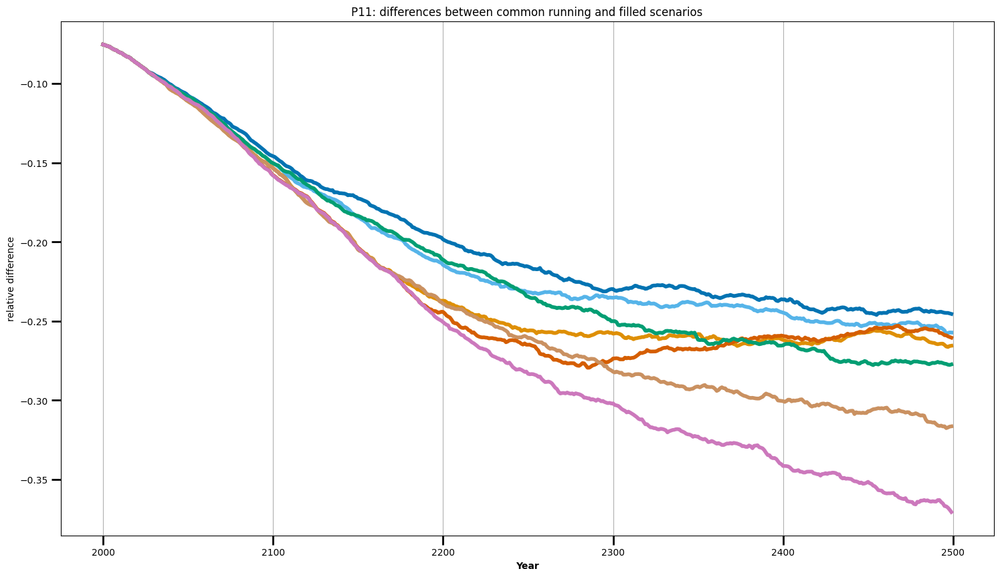

In [12]:
fig, ax = plt.subplots(1,1, figsize=(18,10), sharex=True)
sns.lineplot(data=pd_vol_scenario_rel_diff.loc[pd_vol_scenario_rel_diff.bias_correction==bc],
             hue='scenario', x='time', y= 'diff', 
             palette=paletti,
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
ax.set_xlabel('Year',  weight='bold')
ax.tick_params(axis='both', which='major', width=2, length=10)
ax.grid(axis='x')
plt.ylabel('relative difference')
plt.title('P11: differences between common running and filled scenarios')

# Figures:

In [9]:
# the same file of glacier projections for all figures:
#df_scenario = xr.open_dataset('filled_sum_all_provide_reg_oversh_stab_2000_2500.nc')
# we actually decided to use the 
df_scenario = xr.open_dataset(f'common_running_sum_all_provide_reg_oversh_stab_2000_2500_bc_1980_2019.nc')
# global and glacier region climate changes:
pd_clim_all = pd.read_csv('../annual_glob_rgi_reg_basin_temp_precip_timeseries_oversh_stab.csv', index_col = 'Unnamed: 0')
bc = 'bc_1980_2019' # 'bc_2000_2019' #x #
var = 'temp_20yr_avg'


## Global volume change plot:

In [10]:
#poster_scenarios = ['commitment run (2000-2019)', 'oversh_T20OS15', 'oversh_T25OS15', 'oversh_T30OS15', 'stab_T15', 'stab_T30']

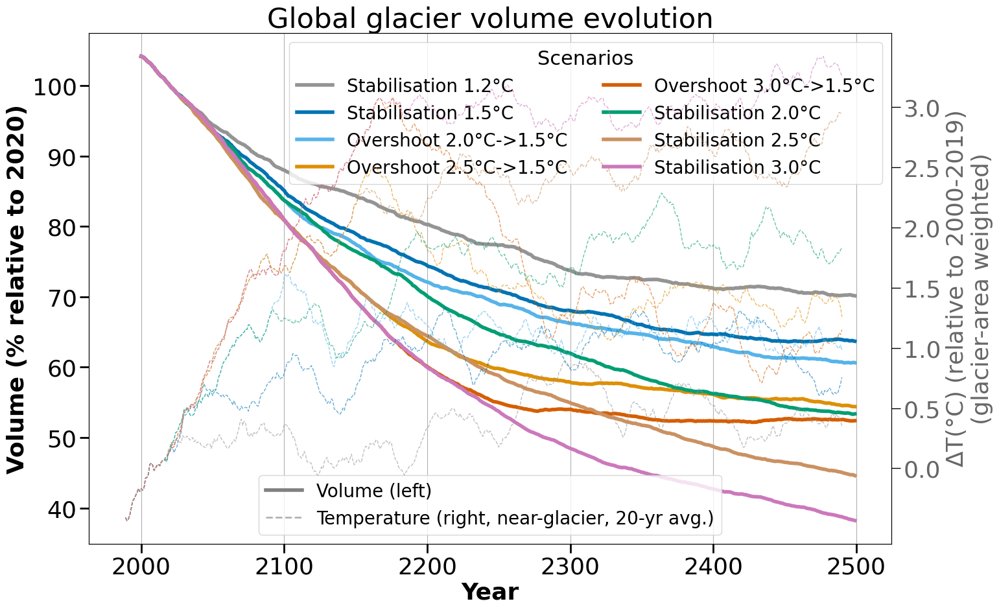

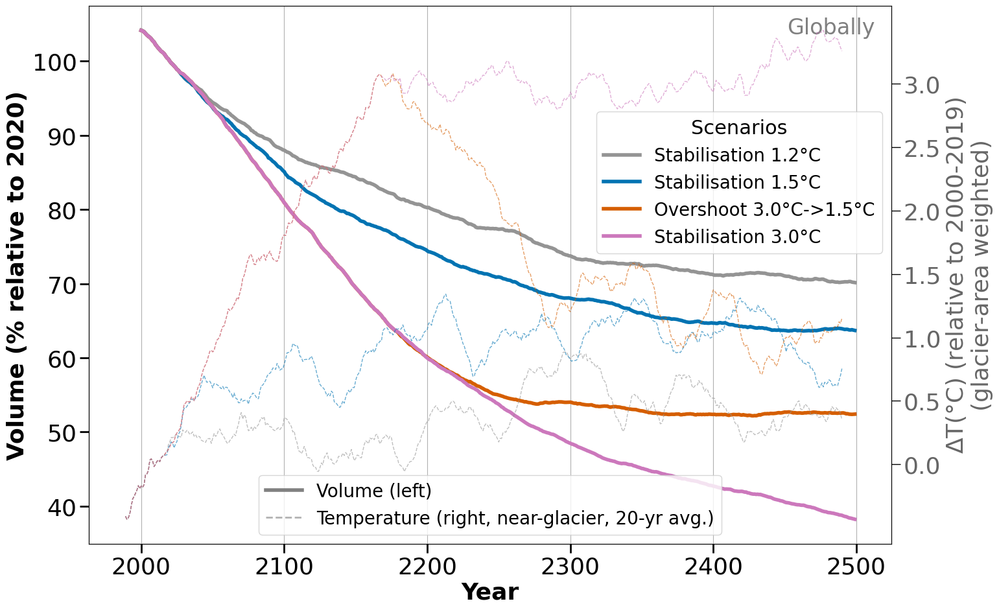

In [17]:
#####
plt.rc('font', size=26)
for a,color_scenarios in zip(['_all', '_poster_iugg'],
                       [color_scenario, color_scenario_poster]):
    scenarios = color_scenarios.keys()
    paletti = list(color_scenarios.values())     
    fig, ax = plt.subplots(1,1, figsize=(16,10), sharex=True)
    pd_vol_scenario_rel = (100*df_scenario/df_scenario.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()
    df_scenario_glob = df_scenario.sum(dim='provide_region')
    pd_vol_scenario_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()

    ax.set_ylabel('Volume (% relative to 2020)', weight='bold')

    sns.lineplot(data=pd_vol_scenario_glob.loc[pd_vol_scenario_glob.bias_correction==bc],
                 hue='scenario', x='time', y= 'volume_rel_2020_%', 
                 palette=paletti,
                 hue_order=scenarios,lw=4, legend=True,
                 ax = ax)
    ax.set_xlabel('Year',  weight='bold')
    ax.tick_params(axis='both', which='major', width=2, length=10)
    ax.grid(axis='x')

    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 0.6, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    ax2.set_yticks(ticks=[0.0,0.5,1.0,1.5,2.0,2.5,3.0],
                   labels=[0.0,0.5,1.0,1.5,2.0,2.5,3.0], alpha=0.6)
    #ax2.set_ylim([-0.9,5.9]);
    ax2.set_ylabel(r'$\Delta$T'+'(°C) (relative to 2000-2019)\n(glacier-area weighted)', alpha =0.6);
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    #plt.ylim([-2,122]);
    plt.tight_layout()
    
    ### add legends
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
    handles_2, labels_2 = ax2.get_legend_handles_labels()
    if a == '_poster_iugg':
        leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], title='Scenarios',
                        fontsize=20, title_fontsize=22, bbox_to_anchor=(1,0.82), loc='upper right')
    else:
        leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], title='Scenarios',
                        fontsize=20, title_fontsize=22, bbox_to_anchor=(1,1), loc='upper right', ncol=2)
    for l in leg.get_lines():
        l.set_linewidth(4)
    leg2 = ax.legend([handles[0], handles_2[0]], ['Volume (left)',
                                                  r'Temperature (right, near-glacier, 20-yr avg.)'],
                     loc='lower center', ncol=1, fontsize=20)
    leg2.get_lines()[0].set_linewidth(4)
    leg2.get_lines()[1].set_linewidth(2)
    for l in leg2.get_lines():
        l.set_color('grey')
    ax.add_artist(leg)
    if a == '_poster_iugg':
        pass
        ax.text(0.98,0.98, 'Globally',
                 transform=ax.transAxes,ha='right',va='top',
                 color='grey', fontsize=24)
    else:
        ax.set_title('Global glacier volume evolution')

    plt.tight_layout()
    plt.savefig(f'2_global_glacier_volume{a}_{bc}.pdf')
    plt.savefig(f'2_global_glacier_volume{a}_{bc}.png')

In [15]:
pd_vol_scenario_glob.loc[pd_vol_scenario_glob.time==2499]

,bias_correction,scenario,gcm,time,calendar_month,OGGM_version,volume_rel_2020_%
499,bc_1980_2019,oversh_T20OS15,GFDL-ESM2M,2499.0,1,OGGM_v161_gdirs_2023.3,60.645939
999,bc_1980_2019,oversh_T25OS15,GFDL-ESM2M,2499.0,1,OGGM_v161_gdirs_2023.3,54.403412
1499,bc_1980_2019,oversh_T30OS15,GFDL-ESM2M,2499.0,1,OGGM_v161_gdirs_2023.3,52.400246
1999,bc_1980_2019,stab_T12,GFDL-ESM2M,2499.0,1,OGGM_v161_gdirs_2023.3,70.151115
2499,bc_1980_2019,stab_T15,GFDL-ESM2M,2499.0,1,OGGM_v161_gdirs_2023.3,63.693253
2999,bc_1980_2019,stab_T20,GFDL-ESM2M,2499.0,1,OGGM_v161_gdirs_2023.3,53.363060
3499,bc_1980_2019,stab_T25,GFDL-ESM2M,2499.0,1,OGGM_v161_gdirs_2023.3,44.605957
3999,bc_1980_2019,stab_T30,GFDL-ESM2M,2499.0,1,OGGM_v161_gdirs_2023.3,38.224495


## Provide region volume evolution...

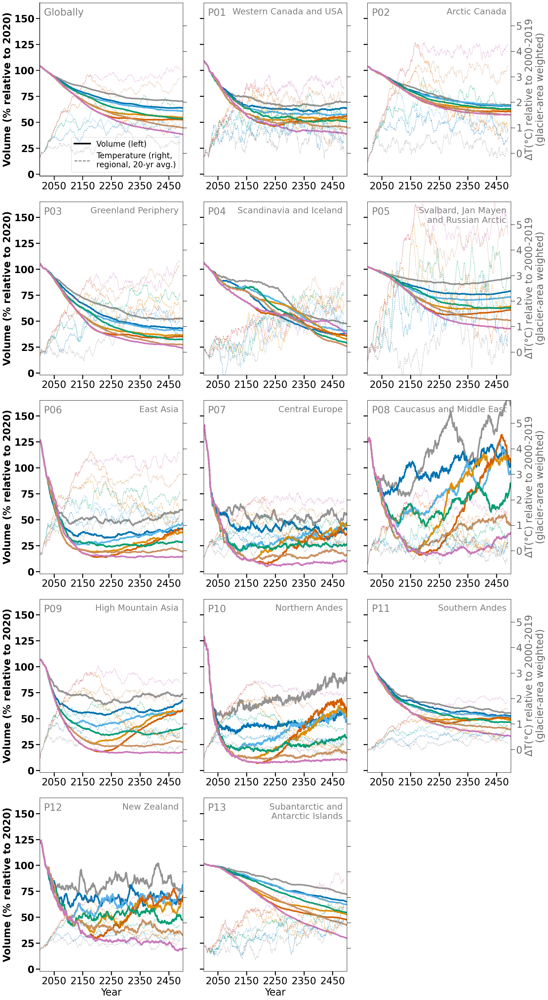

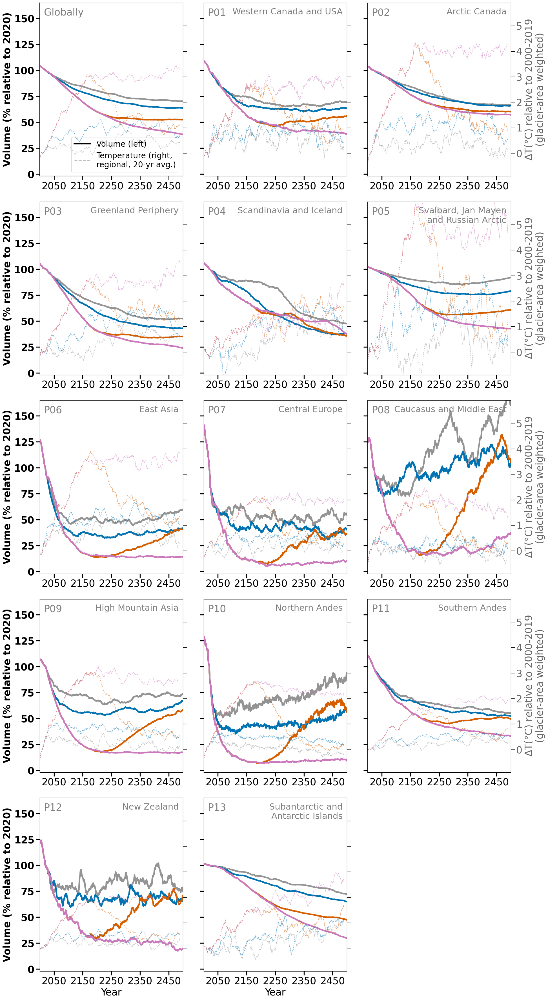

In [19]:
plt.rc('font', size=25)
portrait = True
pd_vol_scenario_rel = (100*df_scenario/df_scenario.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()
df_scenario_glob = df_scenario.sum(dim='provide_region')
pd_vol_scenario_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()

for a,color_scenarios in zip(['_all', '_poster_iugg'],
                       [color_scenario, color_scenario_poster]):
    scenarios = color_scenarios.keys()
    paletti = list(color_scenarios.values())  
    if portrait:
        plt.figure(figsize=(20,36)) #, sharey=True, sharex=True)
        plt.subplot(5,3,1)
    else:
        plt.figure(figsize=(45,16)) #, sharey=True, sharex=True)
        plt.subplot(2,7,1)
    ax = plt.gca()
    #ax.set_title('Globally')
    plt.text(0.03,0.97, 'Globally',
             transform=ax.transAxes,ha='left',va='top',
             color='grey', fontsize=25)
    ax.set_ylabel('Volume (% relative to 2020)', weight='bold')
    sns.lineplot(data=pd_vol_scenario_glob.loc[pd_vol_scenario_glob.bias_correction=='bc_1980_2019'],
                 hue='scenario', x='time', y= 'volume_rel_2020_%', 
                 palette=paletti,
                 hue_order=scenarios,lw=4, legend=True,
                 ax = ax)
    #ax.set_xlabel('Year')
    #ax.grid(axis='x')
    ax.set_ylim([-2,165]);
    ax.set_yticks(ticks=[0,25,50,75,100,125, 150],
                       labels=[0,25,50,75,100,125, 150], weight='bold')

    for axis in 'left', 'bottom':
        ax.spines[axis].set_linewidth(1.5)

    # set the parameters for both axis: label size in font points, the line tick line 
    # width and length in pixels
    ax.tick_params(axis='both', which='major', width=2, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 0.6, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    ax2.set_ylabel('')
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
    ax2.set_ylim([-0.9,5.9]);

    plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
    ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])

    ### add legends
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
    handles_2, labels_2 = ax2.get_legend_handles_labels()
    leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], #title='Scenarios',
                    fontsize=20, title_fontsize=22, bbox_to_anchor=(1,0.9), loc = 'upper right')
    for l in leg.get_lines():
        l.set_linewidth(4)
    leg2 = ax.legend([handles[0], handles_2[0]], ['Volume (left)',
                                                  'Temperature (right,\nregional, 20-yr avg.)'],
                     loc='lower right', ncol=1, fontsize=20)
    leg2.get_lines()[0].set_linewidth(4)
    leg2.get_lines()[1].set_linewidth(2)
    for l in leg2.get_lines():
        l.set_color('black')
    #ax.add_artist(leg)


    for j, pi in enumerate(np.arange(1,14,1)):
        if pi<10:
            Preg = f'P0{pi}'
        else:
            Preg = f'P{pi}'
        if portrait:
            plt.subplot(5,3,j+2)
            x_j = np.arange(2,15,3)
            x2_j = np.arange(1,15,3)
            year_xlabel_condi = j>10

        else:
            plt.subplot(2,7,j+2)
            x_j = [6]
            x2_j = [5,12]
            year_xlabel_condi = j>5
        ax = plt.gca()
        pd_vol_scenario_rel_reg = pd_vol_scenario_rel.loc[pd_vol_scenario_rel.provide_region==Preg]
        sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_1980_2019'],
                     hue='scenario', x='time', y= 'volume_rel_2020_%', 
                     palette=paletti,
                 hue_order=scenarios,lw=4, legend=False,
                 ax = ax)

        #ax.set_title(f'{Preg}')
        plt.text(0.03,0.97, Preg,
                 transform=ax.transAxes,ha='left',va='top',
                 color='grey', fontsize=25)
        plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
                 transform=ax.transAxes,ha='right',va='top',
                 color='grey', fontsize=22)
        ax.set_yticks(ticks=[0,25,50,75,100,125, 150],
                       labels=[0,25,50,75,100,125, 150], weight='bold')
        if j in x_j:
            plt.ylabel(f'Volume (% relative to 2020)', weight='bold')
            ax.set_yticks(ticks=[0,25,50,75,100,125, 150],
                       labels=[0,25,50,75,100,125, 150], weight='bold')
        else:
            plt.ylabel('')
            ax.set_yticks(ticks=[0,25,50,75,100,125, 150],
                       labels=[0,25,50,75,100,125, 150], alpha=0, fontsize=1) #visible=False) 
            #plt.setp(ax.get_yticklabels(), visible=False)

        ax.set_ylim([-2,165]);
        ax.tick_params(axis='both', which='major', width=2.5, length=10)
        ax2 = ax.twinx()  
        for scenario in scenarios:
                        #'stab_T30']:

            pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
            pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'provide_reg_{Preg}_glacier']
            pd_clim_scenario_g.index = pd_clim_scenario_g.year
            temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

            ax2.plot(pd_clim_scenario_g.year,
                     var_g_to_ref,
                     alpha = 0.6, 
                     ls = '--',
                     lw=1, color = color_scenario[scenario], label=label_scenario[scenario])

        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
        if j in x2_j:
            ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                          alpha = 0.6)
            #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
        else:
            ax2.set_ylabel('')
            #ax2.set_yticks([])
            plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

        ax2.set_ylim([-0.9,5.9]);
        if year_xlabel_condi:
            ax.set_xlabel('Year')
        else:
            ax.set_xlabel('')
        ax.set_xlim([2000,2500])
        ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
        ax2.set_xlim([2000,2500])
        ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)  

    plt.tight_layout()
    #plt.savefig('test_provide_reg.png', dpi=450) #, bbox_inches='tight')
    if portrait:
        plt.savefig(f'2_provide_reg_volume_changes_overshoot{a}_{bc}_portrait_3cols.pdf')
        plt.savefig(f'2_provide_reg_volume_changes_overshoot{a}_{bc}_portrait_3cols.png')

    else:
        plt.savefig(f'2_provide_reg_volume_changes_overshoot{a}_{bc}.pdf')

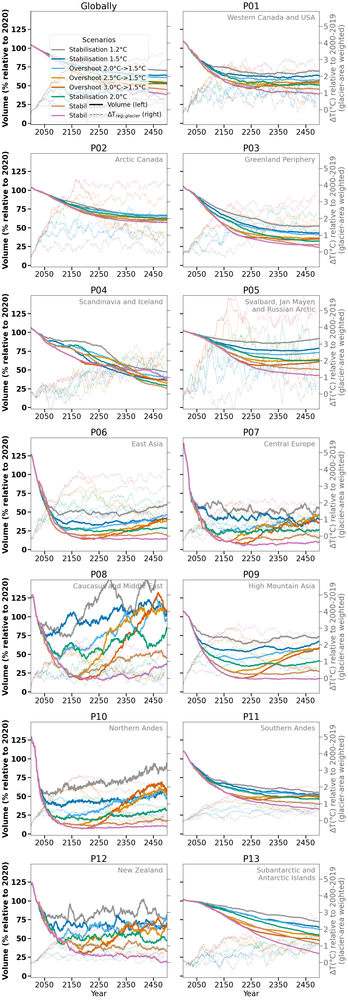

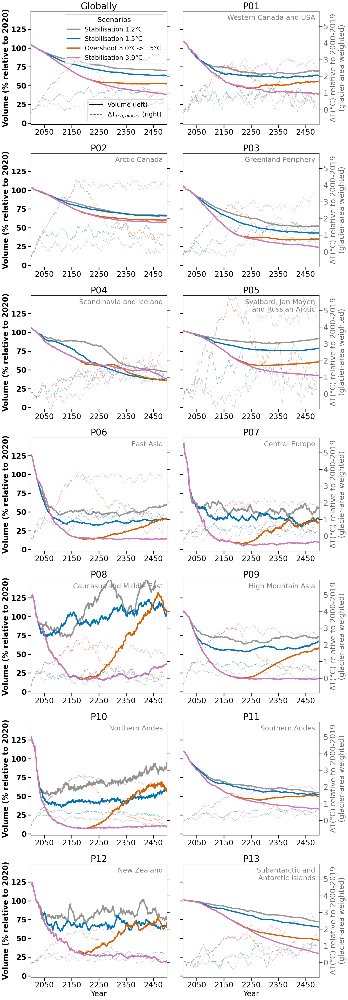

In [82]:
plt.rc('font', size=24)
portrait = True
pd_vol_scenario_rel = (100*df_scenario/df_scenario.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()
df_scenario_glob = df_scenario.sum(dim='provide_region')
pd_vol_scenario_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()

for a,color_scenarios in zip(['_all', '_poster_iugg'],
                       [color_scenario, color_scenario_poster]):
    scenarios = color_scenarios.keys()
    paletti = list(color_scenarios.values())  
    if portrait:
        plt.figure(figsize=(16,45)) #, sharey=True, sharex=True)
        plt.subplot(7,2,1)
    else:
        plt.figure(figsize=(45,16)) #, sharey=True, sharex=True)
        plt.subplot(2,7,1)
    ax = plt.gca()
    ax.set_title('Globally')

    ax.set_ylabel('Volume (% relative to 2020)', weight='bold')
    sns.lineplot(data=pd_vol_scenario_glob.loc[pd_vol_scenario_glob.bias_correction=='bc_1980_2019'],
                 hue='scenario', x='time', y= 'volume_rel_2020_%', 
                 palette=paletti,
                 hue_order=scenarios,lw=4, legend=True,
                 ax = ax)
    #ax.set_xlabel('Year')
    #ax.grid(axis='x')
    ax.set_ylim([-2,149]);
    ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')

    for axis in 'left', 'bottom':
        ax.spines[axis].set_linewidth(1.5)

    # set the parameters for both axis: label size in font points, the line tick line 
    # width and length in pixels
    ax.tick_params(axis='both', which='major', width=2, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 0.6, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    ax2.set_ylabel('')
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
    ax2.set_ylim([-0.9,5.9]);

    plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
    ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])

    ### add legends
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
    handles_2, labels_2 = ax2.get_legend_handles_labels()
    leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], title='Scenarios', fontsize=20, title_fontsize=22)
    for l in leg.get_lines():
        l.set_linewidth(4)
    leg2 = ax.legend([handles[0], handles_2[0]], ['Volume (left)',
                                                  r'$\Delta$T$_{reg,glacier}$ '+'(right)'],
                     loc='lower right', ncol=1, fontsize=20)
    leg2.get_lines()[0].set_linewidth(4)
    leg2.get_lines()[1].set_linewidth(2)
    for l in leg2.get_lines():
        l.set_color('black')
    ax.add_artist(leg)


    for j, pi in enumerate(np.arange(1,14,1)):
        if pi<10:
            Preg = f'P0{pi}'
        else:
            Preg = f'P{pi}'
        if portrait:
            plt.subplot(7,2,j+2)
            x_j = np.arange(1,15,2)
            x2_j = np.arange(0,15,2)
            year_xlabel_condi = j>10

        else:
            plt.subplot(2,7,j+2)
            x_j = [6]
            x2_j = [5,12]
            year_xlabel_condi = j>5
        ax = plt.gca()
        pd_vol_scenario_rel_reg = pd_vol_scenario_rel.loc[pd_vol_scenario_rel.provide_region==Preg]
        sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_1980_2019'],
                     hue='scenario', x='time', y= 'volume_rel_2020_%', 
                     palette=paletti,
                 hue_order=scenarios,lw=4, legend=False,
                 ax = ax)

        ax.set_title(f'{Preg}')
        plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
                 transform=ax.transAxes,ha='right',va='top',
                 color='grey', fontsize=22)
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')
        if j in x_j:
            plt.ylabel(f'Volume (% relative to 2020)', weight='bold')
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')
        else:
            plt.ylabel('')
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
            #plt.setp(ax.get_yticklabels(), visible=False)

        ax.set_ylim([-2,149]);
        ax.tick_params(axis='both', which='major', width=2.5, length=10)
        ax2 = ax.twinx()  
        for scenario in scenarios:
                        #'stab_T30']:

            pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
            pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'provide_reg_{Preg}_glacier']
            pd_clim_scenario_g.index = pd_clim_scenario_g.year
            temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

            ax2.plot(pd_clim_scenario_g.year,
                     var_g_to_ref,
                     alpha = 0.6, 
                     ls = '--',
                     lw=1, color = color_scenario[scenario], label=label_scenario[scenario])

        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
        if j in x2_j:
            ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                          alpha = 0.6)
            #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
        else:
            ax2.set_ylabel('')
            #ax2.set_yticks([])
            plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

        ax2.set_ylim([-0.9,5.9]);
        if year_xlabel_condi:
            ax.set_xlabel('Year')
        else:
            ax.set_xlabel('')
        ax.set_xlim([2000,2500])
        ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
        ax2.set_xlim([2000,2500])
        ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)  

    plt.tight_layout()
    #plt.savefig('test_provide_reg.png', dpi=450) #, bbox_inches='tight')
    if portrait:
        plt.savefig(f'2_provide_reg_volume_changes_overshoot{a}_{bc}_portrait.pdf')
        plt.savefig(f'2_provide_reg_volume_changes_overshoot{a}_{bc}_portrait.png')

    else:
        plt.savefig(f'2_provide_reg_volume_changes_overshoot{a}_{bc}.pdf')

In [83]:
dsel = df_scenario.sel(provide_region='P11').sel(bias_correction=bc).isel(time=0)
assert dsel.volume.std() < 0.01

AssertionError: 

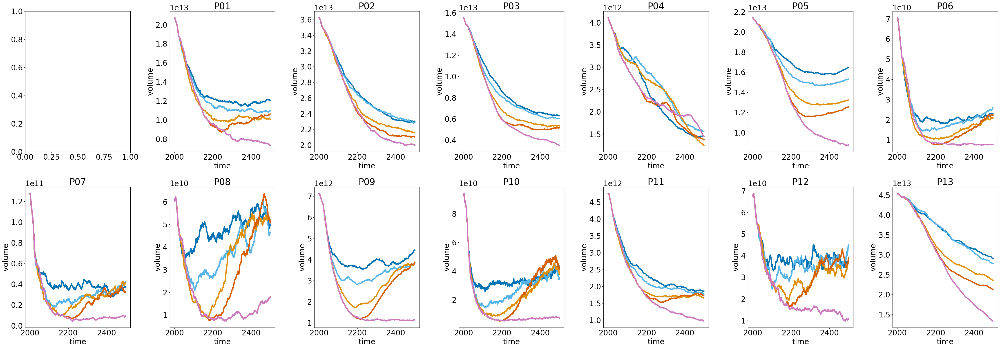

In [121]:
var = 'temp_20yr_avg'

plt.rc('font', size=24)
#xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_provide_reg_common_running_glaciers.nc')


plt.figure(figsize=(45,16)) #, sharey=True, sharex=True)
plt.subplot(2,7,1)



for j, pi in enumerate(np.arange(1,14,1)):
    if pi<10:
        Preg = f'P0{pi}'
    else:
        Preg = f'P{pi}'
    plt.subplot(2,7,j+2)
    ax = plt.gca()
    pd_vol_scenario_rel_reg = df_scenario.sel(provide_region=Preg).volume.to_dataframe('volume').reset_index()
    sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction==bc],
                 hue='scenario', x='time', y= 'volume', 
                 palette=color_scenario_poster,
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
    
    ax.set_title(f'{Preg}')


plt.tight_layout()
#plt.savefig('test_provide_reg.png', dpi=450) #, bbox_inches='tight')
#plt.savefig('overshoot_provide_reg.pdf')

### Basin plots

In [20]:
import geopandas as gpd
df_scenario_common_basin = xr.open_dataset(f'common_running_sum_all_basins_oversh_stab_2000_2500_bc_1980_2019.nc')
pd_basin_num = gpd.read_file('/home/www/fmaussion/misc/magicc/basins_shape/glacier_basins.shp')
f = open('/home/www/lschuster/provide/provide_glacier_regions/basin_ids_per_provide_region.json')
basins_per_preg = json.load(f)

pd_vol_scenario_rel_common_basin = (100*df_scenario_common_basin/df_scenario_common_basin.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()
pd_vol_scenario_rel_common_basin = pd_vol_scenario_rel_common_basin.loc[pd_vol_scenario_rel_common_basin.bias_correction==bc]
scenarios = list(color_scenario_poster.keys())

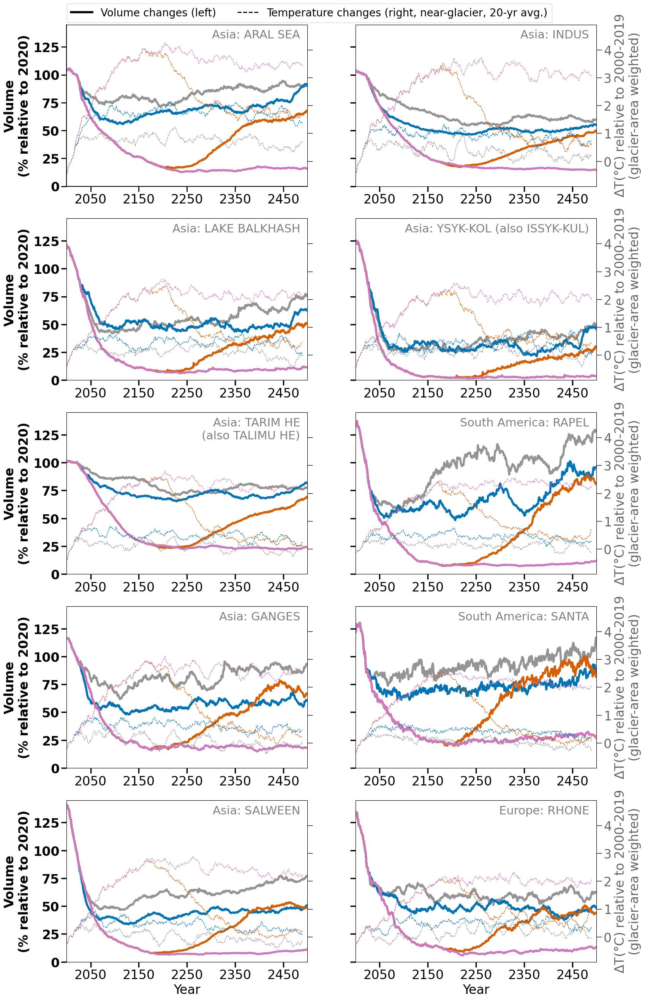

In [21]:
var = 'temp_20yr_avg'
basins = np.array([2902, 2309, 2910, 2919, 2914, 3423, 2306, 3425, 2319, 6243]) # 10 most arid and glaciated basins ... pd_basins_arid_glac_num.MRBID.values


plt.rc('font', size=24)

plt.figure(figsize=(18,32)) #, sharey=True, sharex=True)
plt.subplot(5,2,1)
ax = plt.gca()


basin = basins[0]
basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0]#.split()#[0]
continent_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['CONTINENT'].values[0]#.split()#[0]
basin_name = f'{continent_n}: {basin_n}'
#ax.set_title(basin_name)
sns.lineplot(data=pd_vol_scenario_rel_common_basin.loc[pd_vol_scenario_rel_common_basin.basin == str(basin)],
             hue='scenario', x='time', y= 'volume_rel_2020_%', 
             palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
plt.ylabel(f'Volume\n(% relative to 2020)', weight='bold')
ax.set_yticks(ticks=[0,25,50,75,100,125],
           labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in scenarios:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    if var == 'temp_20yr_avg':
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
    else:
        var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 1, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
if var != 'temp_20yr_avg':
    ticks = np.arange(70,131,10)
    ax2.set_yticks(ticks=ticks,
                    labels=ticks, alpha=0.6) 
else:
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)


plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])

ax2.set_ylim([-0.9,4.9]);
ax.set_ylim([0,145]);

### add legends
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
handles_2, labels_2 = ax2.get_legend_handles_labels()
leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], #title='Scenarios',
                fontsize=20, title_fontsize=22,loc = 'lower left', bbox_to_anchor=(-0.02,1.11), ncol=3)
for l in leg.get_lines():
    l.set_linewidth(4)
    
leg2 = ax.legend([handles[0], handles_2[0]], ['Volume changes (left)',
                                                  r'Temperature changes (right, near-glacier, 20-yr avg.)'],
                 loc='lower left', fontsize=20, bbox_to_anchor=(-0.02,0.98), ncol=2)
leg2.get_lines()[0].set_linewidth(4)
leg2.get_lines()[1].set_linewidth(2)
for l in leg2.get_lines():
    l.set_color('black')
#ax.add_artist(leg)

plt.text(0.97,0.97, basin_name,
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22, zorder=-1)


for j, basin in enumerate(basins[1:]):
    basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0]#.split()[0]
    if basin_n=='TARIM HE (also TALIMU HE)':
        basin_n = 'TARIM HE\n(also TALIMU HE)'
    continent_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['CONTINENT'].values[0]#.split()#[0]
    basin_name = f'{continent_n}: {basin_n}'
    plt.subplot(5,2,j+2)
    x_j = np.arange(1,20,2)
    x2_j = np.arange(0,20,2)

    ax = plt.gca()

    basin_vol_sel = pd_vol_scenario_rel_common_basin.loc[pd_vol_scenario_rel_common_basin.basin == str(basin)]
    sns.lineplot(data=basin_vol_sel,
             hue='scenario', x='time', y=  'volume_rel_2020_%',  
                 palette=list(color_scenario_poster.values()),
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)

    #ax.set_title(f'{Preg}: {basin}')

    plt.text(0.97,0.97, basin_name,
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22, zorder=-1)

    if j in x_j:
        plt.ylabel(f'Volume\n(% relative to 2020)', weight='bold')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
            #plt.setp(ax.get_yticklabels(), visible=False)
     #plt.setp(ax.get_yticklabels(), visible=False)

    #ax.set_ylim([70,1439.9]);


    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g
        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
    if var != 'temp_20yr_avg':
        ticks = np.arange(70,131,10)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
        ylabel = 'near-glacier precipitation \n(% relative to 2000-2019)' #, glacier-area weighted)'

    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
        ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

    if j in x2_j:
        ax2.set_ylabel(ylabel,
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

    #ax2.set_ylim([0,5.5]);

    if j >6:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax2.set_ylim([-0.9,4.9]);
    ax.set_ylim([0,145]);
#plt.tight_layout()
plt.savefig(f'figures/figures_basins/2_most_arid_glaciated_basin_50yr_volume_{bc}_vs_prcp_poster_iugg.png')
plt.savefig(f'figures/figures_basins/2_most_arid_glaciated_basin_50yr_volume_{bc}_vs_prcp_poster_iugg.pdf')


<xarray.DataArray 'provide_region' (provide_region: 13)>
array(['P01', 'P02', 'P03', 'P04', 'P05', 'P06', 'P07', 'P08', 'P09', 'P10',
       'P11', 'P12', 'P13'], dtype=object)
Coordinates:
  * provide_region  (provide_region) object 'P01' 'P02' 'P03' ... 'P12' 'P13'
    OGGM_version    <U22 'OGGM_v161_gdirs_2023.3'

**For every basin separately**

In [71]:
plt.rc('font', size=24)
portrait = True

for Preg in df_scenario.provide_region.values:
    basins = basins_per_preg[Preg]
    if len(basins)<1:
        continue
    for a,color_scenarios in zip(['_all', '_poster_iugg'],
                           [color_scenario, color_scenario_poster]):
        scenarios = color_scenarios.keys()
        paletti = list(color_scenarios.values())  
        if portrait:
            plt.figure(figsize=(24,30)) #, sharey=True, sharex=True)
            plt.subplot(5,4,1)
        else:
            plt.figure(figsize=(45,16)) #, sharey=True, sharex=True)
            plt.subplot(2,8,1)
        ax = plt.gca()

        ax.set_ylabel('Volume\n(% relative to 2020)', weight='bold')
        basin = basins[0]
        basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0].split()[0]
        basin_name = f'{Preg}: {basin_n} ({basin})'
        ax.set_title(basin_name)
        sns.lineplot(data=pd_vol_scenario_rel_common_basin.loc[pd_vol_scenario_rel_common_basin.basin == str(basin)],
                     hue='scenario', x='time', y= 'volume_rel_2020_%', 
                     palette=paletti,
                     hue_order=scenarios,lw=4, legend=True,
                     ax = ax)
        #ax.set_xlabel('Year')
        #ax.grid(axis='x')
        ax.set_ylim([-2,149]);
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                      labels=[0,25,50,75,100,125], weight='bold')

        for axis in 'left', 'bottom':
            ax.spines[axis].set_linewidth(1.5)

        # set the parameters for both axis: label size in font points, the line tick line 
        # width and length in pixels
        ax.tick_params(axis='both', which='major', width=2, length=10)
        ax2 = ax.twinx()  
        for scenario in scenarios:
            pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
            pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
            pd_clim_scenario_g.index = pd_clim_scenario_g.year
            temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

            ax2.plot(pd_clim_scenario_g.year,
                     var_g_to_ref,
                     alpha = 0.6, 
                     ls = '--',
                     lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
        ax2.set_ylabel('')
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                       labels=[0,1,2,3,4,5], alpha=0.6)
        ax2.set_ylim([-0.9,5.9]);

        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
        ax.set_xlabel('')
        ax.set_xlim([2000,2500])
        ax2.set_xlim([2000,2500])
        ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
        ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])

        ### add legends
        handles, labels = ax.get_legend_handles_labels()
        ax.get_legend().remove()
        handles_2, labels_2 = ax2.get_legend_handles_labels()
        leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], title='Scenarios', fontsize=20, title_fontsize=22)
        for l in leg.get_lines():
            l.set_linewidth(4)
        leg2 = ax.legend([handles[0], handles_2[0]], ['Volume (left)',
                                                      r'$\Delta$T$_{reg,glacier}$ '+'(right)'],
                         loc='lower right', ncol=1, fontsize=20)
        leg2.get_lines()[0].set_linewidth(4)
        leg2.get_lines()[1].set_linewidth(2)
        for l in leg2.get_lines():
            l.set_color('grey')
        ax.add_artist(leg)


        for j, basin in enumerate(basins[1:]):
            basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0].split()[0]

            if portrait:
                plt.subplot(5,4,j+2)
                x_j = np.arange(3,20,4)
                x2_j = np.arange(2,20,4)
                year_xlabel_condi = j>10

            else:
                plt.subplot(2,8,j+2)
                x_j = [6]
                x2_j = [5,12]
                year_xlabel_condi = j>5
            ax = plt.gca()
            sns.lineplot(data=pd_vol_scenario_rel_common_basin.loc[pd_vol_scenario_rel_common_basin.basin == str(basin)],
                         hue='scenario', x='time', y= 'volume_rel_2020_%', 
                         palette=paletti,
                     hue_order=scenarios,lw=4, legend=False,
                     ax = ax)

            ax.set_title(f'{Preg}: {basin}')
            plt.text(0.97,0.97, basin_n,
                     transform=ax.transAxes,ha='right',va='top',
                     color='grey', fontsize=22)
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                           labels=[0,25,50,75,100,125], weight='bold')
            if j in x_j:
                plt.ylabel(f'Volume\n(% relative to 2020)', weight='bold')
                ax.set_yticks(ticks=[0,25,50,75,100,125],
                           labels=[0,25,50,75,100,125], weight='bold')
            else:
                plt.ylabel('')
                ax.set_yticks(ticks=[0,25,50,75,100,125],
                           labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
                #plt.setp(ax.get_yticklabels(), visible=False)

            ax.set_ylim([-2,149]);
            ax.tick_params(axis='both', which='major', width=2.5, length=10)
            ax2 = ax.twinx()  
            for scenario in scenarios:
                pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
                pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
                pd_clim_scenario_g.index = pd_clim_scenario_g.year
                temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
                var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

                ax2.plot(pd_clim_scenario_g.year,
                         var_g_to_ref,
                         alpha = 0.6, 
                         ls = '--',
                         lw=1, color = color_scenario[scenario], label=label_scenario[scenario])

            ax2.set_yticks(ticks=[0,1,2,3,4,5],
                       labels=[0,1,2,3,4,5], alpha=0.6)
            if j in x2_j:
                ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                              alpha = 0.6)
                #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
            else:
                ax2.set_ylabel('')
                #ax2.set_yticks([])
                plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

            ax2.set_ylim([-0.9,5.9]);
            #if year_xlabel_condi:
            ax.set_xlabel('Year')
            #else:
            #    ax.set_xlabel('')
            ax.set_xlim([2000,2500])
            ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
            ax2.set_xlim([2000,2500])
            ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)  

        plt.tight_layout()
        #plt.savefig('test_provide_reg.png', dpi=450) #, bbox_inches='tight')
        if portrait:
            plt.savefig(f'figures/figures_basins/2_{Preg}_basin_volume_changes_overshoot{a}_{bc}_portrait.png')
        else:
            plt.savefig(f'figures/figures_basins/2_{Preg}_basin_volume_changes_overshoot{a}_{bc}.png')
        plt.close()

In [16]:
pd_clim_all

,temp,temp_20yr_avg,precip,precip_20yr_avg,region,scenario,year
0,287.629999,NaN,1090.520351,NaN,global,stab_T15,1979
1,287.697952,NaN,1097.156112,NaN,global,stab_T15,1980
2,287.467248,NaN,1088.562243,NaN,global,stab_T15,1981
3,287.449083,NaN,1088.729391,NaN,global,stab_T15,1982
4,287.301079,NaN,1081.871293,NaN,global,stab_T15,1983
...,...,...,...,...,...,...,...
47406,266.932529,NaN,805.111779,NaN,provide_reg_P13_glacier,stab_T30,2495
47407,268.439595,NaN,993.049583,NaN,provide_reg_P13_glacier,stab_T30,2496
47408,267.524698,NaN,915.220099,NaN,provide_reg_P13_glacier,stab_T30,2497
47409,266.180117,NaN,659.114756,NaN,provide_reg_P13_glacier,stab_T30,2498
